In [2]:
### load basic python libraries###
import numpy as np 
import h5py
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
#import scvelo as scv
import seaborn as sns
import matplotlib as mpl
import matplotlib.gridspec as gridspec
from matplotlib import rc_params
%matplotlib inline
from matplotlib import pyplot as pl
from matplotlib import rc_params
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from scipy.interpolate import make_interp_spline

import statsmodels.api as sm

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
sc.set_figure_params(dpi = 150, dpi_save = 150, format = 'png')
sc._settings.ScanpyConfig(verbosity=0)



import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
pd.set_option('display.max_rows', 100)
np.random.seed(44)

## read the all integrated MiSTR dataset

In [2]:
adata = sc.read_h5ad('/scratch/mistr-atlas/new/all_mistr_mnn.h5ad')

In [3]:
sc.pp.normalize_total(adata, target_sum=10_000)
sc.pp.log1p(adata)

In [4]:
sc.pp.scale(adata)

In [5]:
sc.pp.neighbors(adata, use_rep='MNN')

/home/kgr851/.conda/envs/scanpy2/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
sc.tl.leiden(adata, resolution = 1.2)

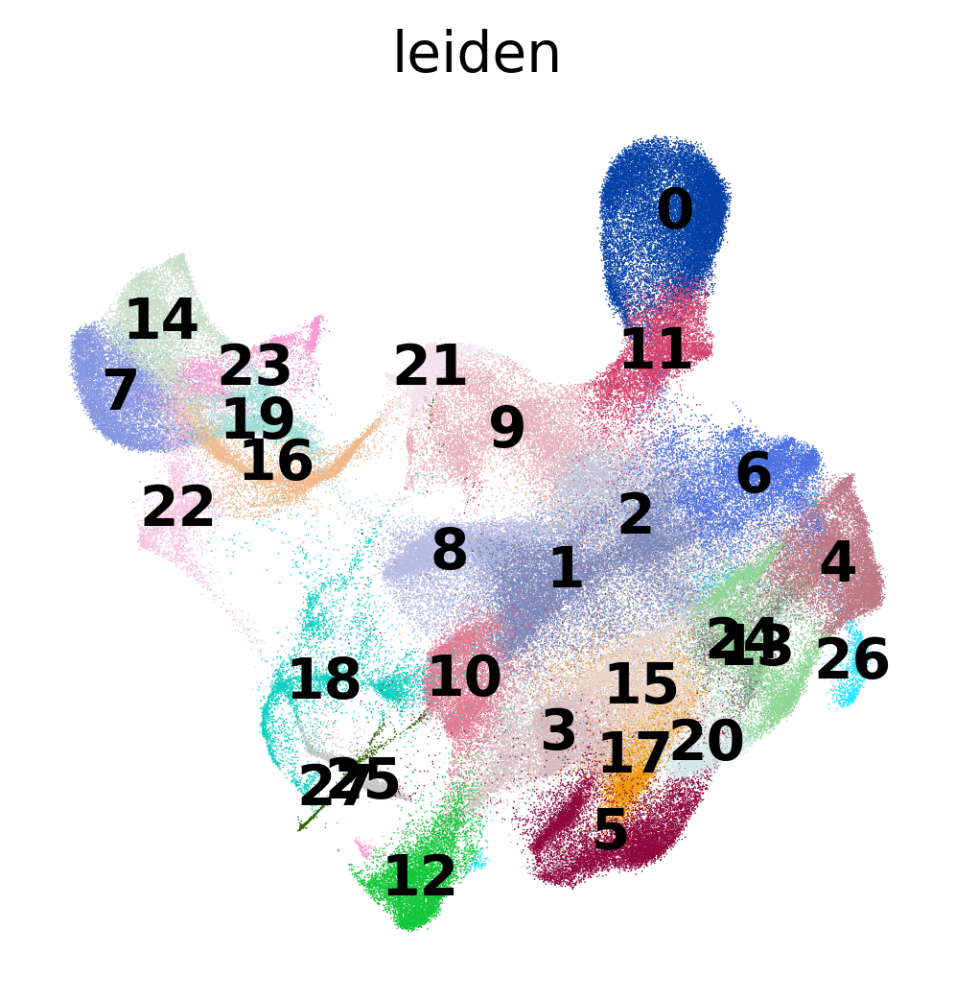

In [7]:
sc.pl.umap(adata, color = 'leiden', legend_loc='on data', frameon=False)

In [8]:
adata

AnnData object with n_obs × n_vars = 206246 × 31522
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'leiden'
    var: 'mean', 'std'
    uns: 'log1p', 'neighbors', 'leiden', 'leiden_colors'
    obsm: 'MNN', 'X_umap'
    layers: 'counts', 'logcounts'
    obsp: 'distances', 'connectivities'

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', key_added = 'wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,key = 'wilcoxon')


In [12]:
#mpl.rcParams['figure.figsize'] = (12, 6)
sc.tl.dendrogram(adata, use_rep = 'MNN', groupby= 'leiden')
#sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="leiden", show_gene_labels=True, vmax = 3, vmin = -3,figsize=(30,15))

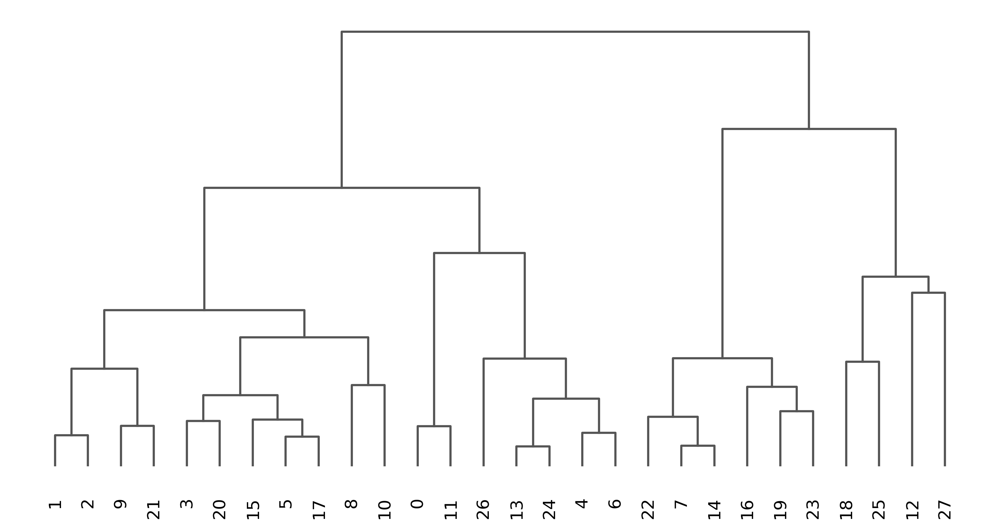

<AxesSubplot:>

In [15]:
mpl.rcParams['figure.figsize'] = (12, 6)
sc.pl.dendrogram(adata,groupby='leiden')

In [16]:
adata_backup = adata.copy()


In [18]:
adata.obs['cell_type'] = adata.obs['leiden'].copy()

leiden_names = ['Pluripotent cells',
                'MHB',
                'Early diencephalon',
                'Ventral diencephalic progeitors',
                'Forebrain Progenitors cycling 1',
                'Dorsal forebrain progenitors',
                'Roof plate progenitors, cycling',
                'Hindbrain neurons 1',
                'Hindbrain precursors',
                'Early rostral progenitors',
                'Midbrain progenitors cycling',
                'Late epi',
                'Hindbrain floor plate',
                'Forebrain progenitors, cycling 2',
                'Cortical interneurons 1',
                'Retinal progenitors',
                'Cortical interneurons 2',
                'Cortical hem',
                'Neuronal precursors undefined 1',
                'Hindbrain neurons 2',
                'Early forebrain progenitors',
                'Neuronal precursors undefined 2',
                'Forebrain neurons',
                'Forebrain neurons intermediate',
                'Forebrain progenitors',
                'Choroid plexus',
                'Anterior floor plate',
                'VLMC'
               ]
#adata.rename_categories('cell_type', leiden_names)
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'])
adata.obs['cell_type'] = adata.obs['cell_type'].cat.rename_categories(leiden_names)

# ###plotting###

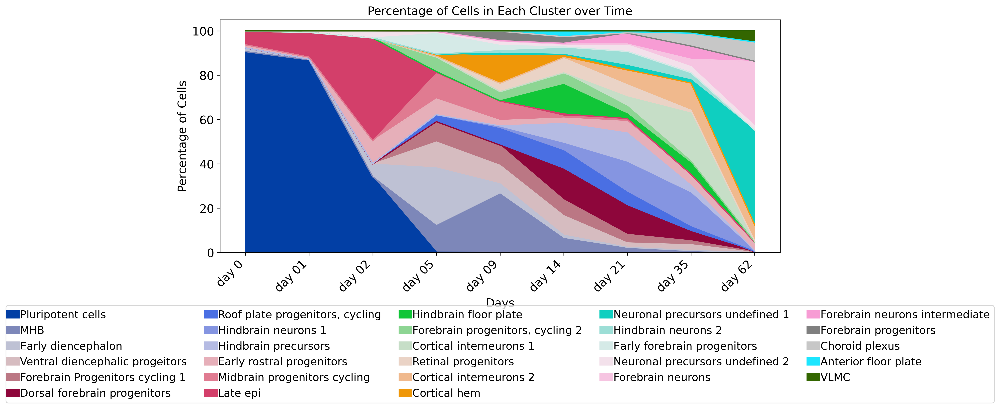

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Extract 'clusters' and 'days' information into a DataFrame
df = pd.DataFrame({
    'clusters': adata.obs['cell_type'],
    'days': adata.obs['day']
})

# Calculate the percentage of cells in each cluster for each day
cluster_day_counts = df.groupby(['days', 'clusters']).size().unstack()
cluster_day_percentages = cluster_day_counts.apply(lambda x: (x / x.sum()) * 100, axis=1)

# Extract colors for the clusters from adata.uns['leiden_colors']
leiden_colors = adata.uns['leiden_colors']
cluster_order = cluster_day_percentages.columns

# Check if leiden_colors is a dictionary or a list
if isinstance(leiden_colors, dict):
    # Extract cluster colors using dictionary lookup
    cluster_colors = [leiden_colors.get(cluster, 'gray') for cluster in cluster_order]
else:
    # Use the list of colors as is
    cluster_colors = leiden_colors

# Create a stacked area plot with custom cluster colors
sns.set_palette(cluster_colors)  # Set the cluster colors for the plot

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=(12, 8))  # Adjust the figure size
gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1])

# Plot the stacked area plot in the top row
ax1 = fig.add_subplot(gs[0])
cluster_day_percentages.plot(kind='area', stacked=True, ax=ax1)
ax1.legend().remove()  # Remove the legend from the stacked area plot

# Set the labels and title for the stacked area plot
ax1.set_xlabel('Days')
ax1.set_ylabel('Percentage of Cells')
ax1.set_title('Percentage of Cells in Each Cluster over Time')
ax1.grid(False)

# Tilt x-axis legends on ax1
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')

# Plot the separate legend in the bottom row
ax2 = fig.add_subplot(gs[1])
ax2.axis('off')  # Remove axis from the legend plot

# Create legend handles and labels
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=10) for color in cluster_colors]
legend_labels = cluster_order

# Display the legend with the custom handles and labels
ax2.legend(legend_handles, legend_labels, loc='center', ncol=5)

# Adjust the spacing between the subplots and increase space between ax1 and ax2
plt.subplots_adjust(hspace=0.5)

plt.savefig('all_integrated_mistr_clustering_annotations_stackplot.svg', dpi=600)
# Display the plot
plt.show()


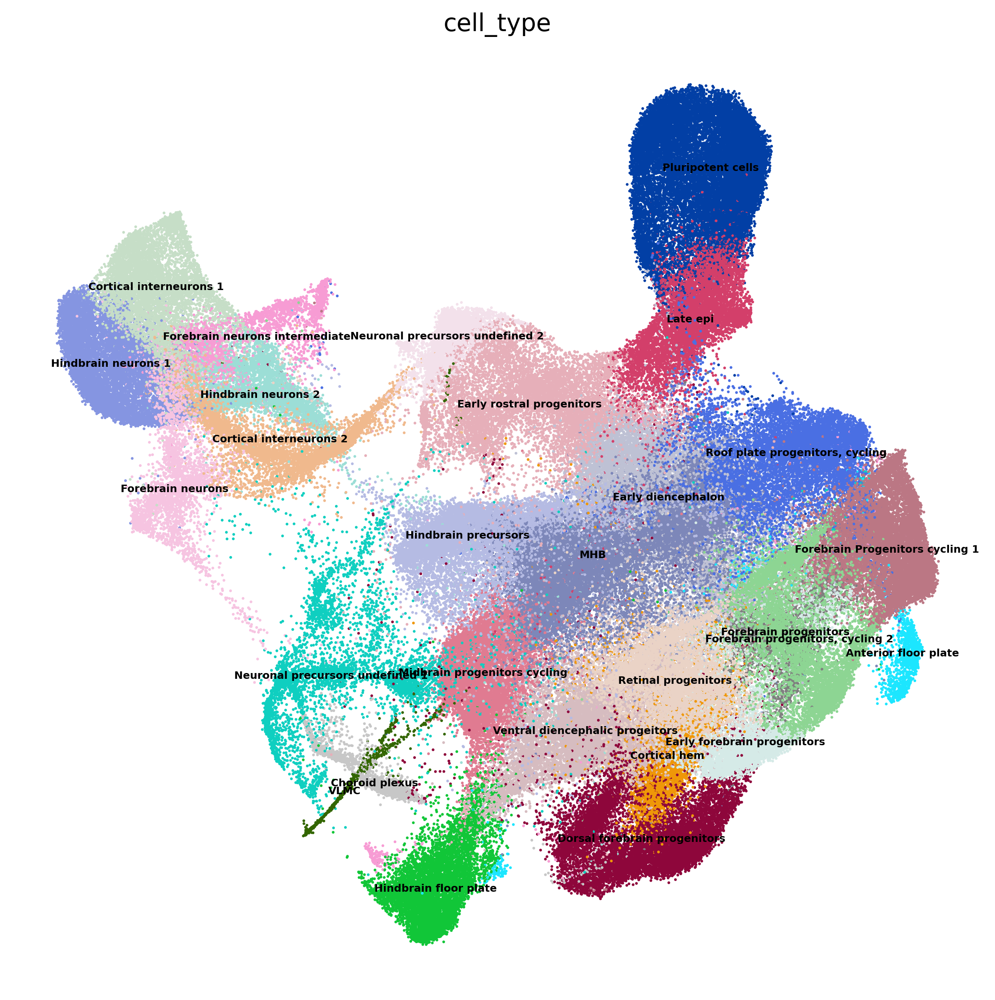

In [20]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.umap(adata, color = ['cell_type'], size = 10, frameon=False,legend_fontsize=6, legend_loc = 'on data',save = 'all_mistr_clusters_legend_top.svg')

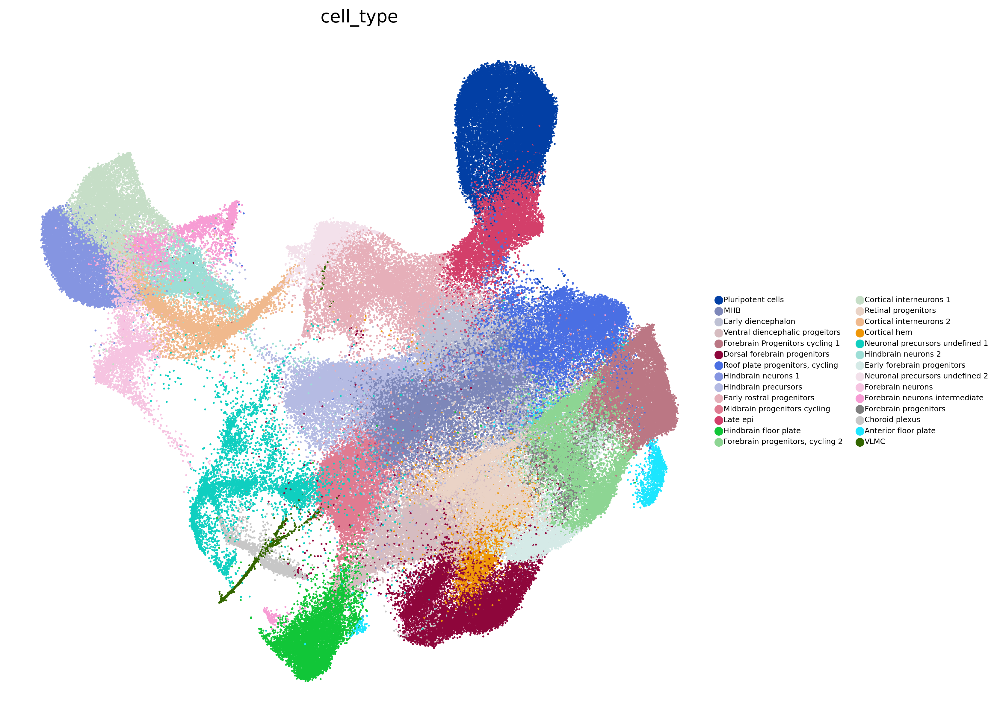

In [21]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.umap(adata, color = ['cell_type'], size = 10, frameon=False,legend_fontsize=6, save = 'all_mistr_clusters.svg')

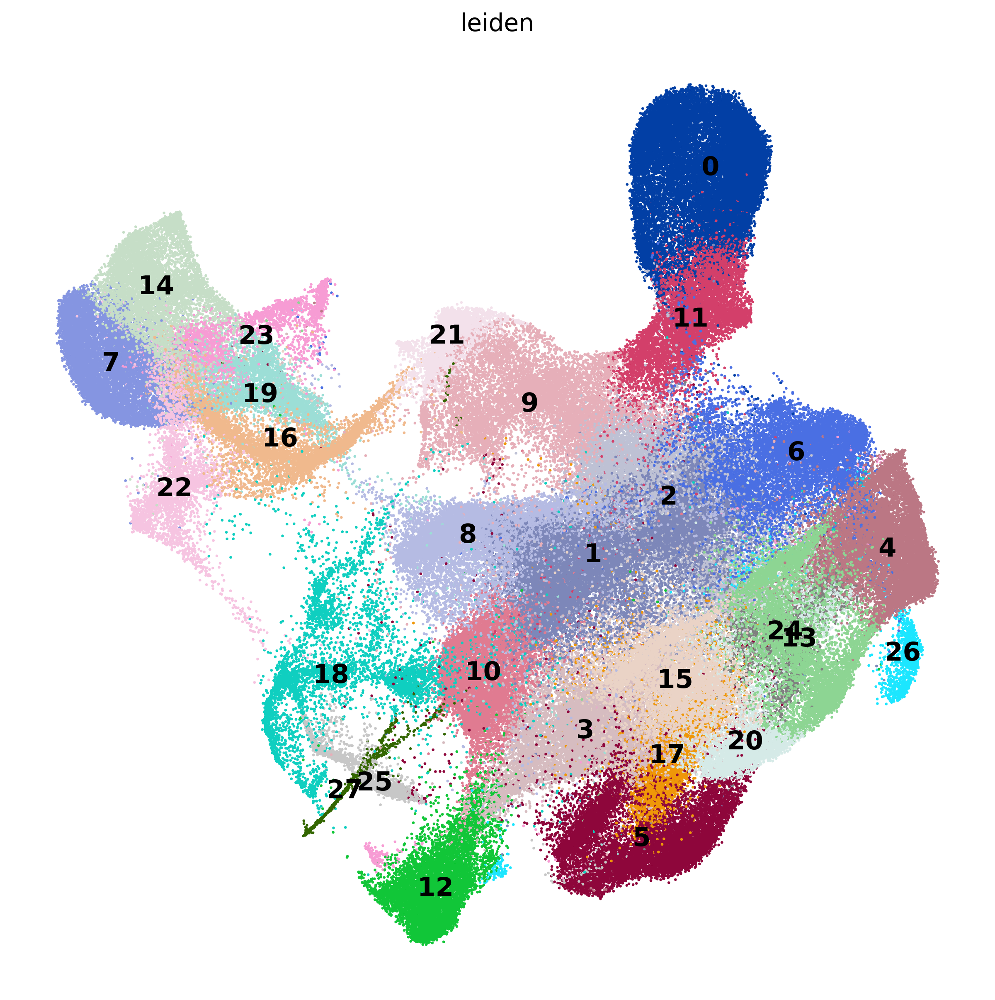

In [22]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.umap(adata, color = ['leiden'], size = 10, frameon=False,legend_fontsize=15, legend_loc = 'on data',save = 'all_mistr_clusters_numbers_top.svg')

## plot receptors and ligands

In [23]:
new_receptor_dict = {
    'LGR': ['LGR4', 'LGR5', 'LGR6', 'LRP5', 'LRP6'],
    'FZD': ['FRZB', 'FZD1', 'FZD2', 'FZD3', 'FZD4', 'FZD5', 'FZD6', 'FZD7', 'FZD8', 'FZD9', 'FZD10'],
    'SMO': ['SMO', 'PTCH1', 'PTCH2', 'GLI1', 'GLI2', 'GLI3'],
    'BMP': ['BMPR1A', 'BMPR1B', 'BMPR2', 'TGFBR1', 'TGFBR2', 'TGFBR3', 'TGFBR3L', 'ALK', 'ACVR1', 'ACVR1B', 'ACVR1C', 'ACVR2A', 'ACVR2B'],
    'FGF': ['FGFR1', 'FGFR2', 'FGFR3', 'FGFR4', 'SPRY1', 'SPRY2', 'SPRY3', 'SPRY4'],
    'NTRK': ['NTRK1', 'NTRK2', 'NTRK3', 'NGFR', 'CNTFR',],
    'EGFR': ['GFRA1', 'GFRA2', 'GFRA3', 'GFRA4', 'RET', 'CRABP1', 'CRABP2'],
    'PDGF': ['PDGFRA', 'PDGFRB'],
    'TNFR': ['FLT1', 'FLT3', 'FLT4', 'LIFR', 'EGFR', 'SORT1', 'IGF1R'],
    'CXCR': ['CXCR2', 'CXCR4'],
    'NOTCH': ['NOTCH1', 'NOTCH2', 'NOTCH3', 'NOTCH4']
}


In [24]:
ligand_dict = {
    'WNT': ['WNT1', 'WNT2B', 'WNT3', 'WNT3A', 'WNT4', 'WNT5A', 'WNT5B', 'WNT6',
            'WNT7A', 'WNT7B', 'WNT8A', 'WNT8B', 'WNT10A', 'WNT10B', 'WNT11', 'WNT16'],
    'SFRP': ['SFRP1', 'SFRP2', 'SFRP4', 'SFRP5'],
    'RSPO': ['RSPO1', 'RSPO2', 'RSPO3', 'RSPO4'],
    'FGF': ['FGF1', 'FGF2', 'FGF3', 'FGF4', 'FGF5', 'FGF7', 'FGF8',
            'FGF9', 'FGF10','FGF11','FGF12','FGF13','FGF14','FGF16', 'FGF17', 'FGF18', 'FGF19', 'FGF20',
            'FGF21', 'FGF22', 'FGF23'],
    'BMP': ['BMP1', 'BMP2', 'BMP3', 'BMP4', 'BMP5', 'BMP6', 'BMP7', 'BMP8A',
            'BMP8B', 'BMP10'],
    'GDF': ['GDF1', 'GDF3', 'GDF5', 'GDF6', 'GDF7', 'GDF9', 'GDF10',
            'GDF11', 'GDF15', 'MSTN'],
    'LIF': ['LIF', 'BDNF', 'GDNF', 'VEGFA', 'VEGFB', 'TNF', 'SHH',
            'FST', 'NTF3', 'IGF1', 'IGF2', 'NPTX2', 'PTX3', 'MDK', 'EGF'],
    'STRA': ['STRA6', 'RBP4', 'RDH10', 'CYP26A1'],
    'SLIT': ['SLIT1', 'SLIT2', 'SLIT3', 'CXCL1', 'CXCL12'],
    'PORCN': ['PORCN', 'DKK1'],
    'PDGF': ['PDGFA', 'PDGFB', 'PDGFC', 'PDGFD', 'CNTF'],
    'TG': ['TGFA', 'TGFB1', 'TGFB2', 'TGFB3', 'LEFTY1', 'LEFTY2', 'INHBA',
           'INHBB', 'INHBC', 'INHBE', 'NODAL'],
    'JAG': ['JAG1', 'JAG2', 'DLL1', 'DLL3', 'DLL4', 'DLK1'],
}

In [25]:
sc.tl.dendrogram(adata, use_rep = 'MNN', groupby= 'cell_type')

In [26]:
## reorder the clusters 

adata_clusters_reordered = adata.copy()

adata_clusters_reordered.obs['cell_type'] = adata_clusters_reordered.obs['cell_type'].cat.reorder_categories(['Pluripotent cells',
                'Late epi',
                'Early rostral progenitors',
                'Early forebrain progenitors',
                'Forebrain progenitors',
                'Forebrain Progenitors cycling 1',
                'Forebrain progenitors, cycling 2',
                'Retinal progenitors',
                'Cortical hem',
                'Dorsal forebrain progenitors',
                'Early diencephalon',
                'Ventral diencephalic progeitors',
                'Roof plate progenitors, cycling',
                'Midbrain progenitors cycling',
                'MHB',
                'Hindbrain precursors',
                'Hindbrain floor plate',
                'Neuronal precursors undefined 1',
                'Neuronal precursors undefined 2',
                'Forebrain neurons',
                'Forebrain neurons intermediate',
                'Cortical interneurons 1',
                'Cortical interneurons 2',
                'Hindbrain neurons 1',
                'Hindbrain neurons 2',
                'Choroid plexus',
                'Anterior floor plate',
                'VLMC'
               ]
)


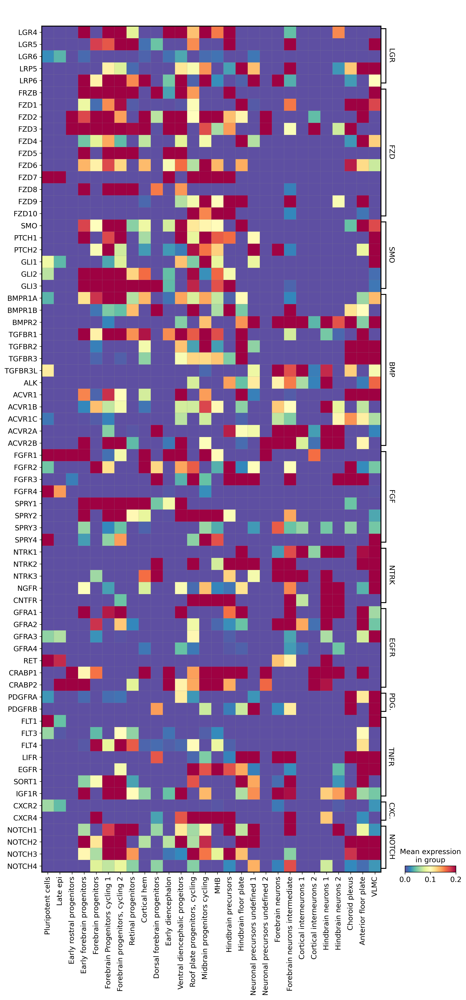

In [29]:
sc.pl.matrixplot(adata_clusters_reordered, new_receptor_dict, groupby='cell_type', 
                 cmap='Spectral_r', swap_axes=True,vmin = 0,vmax=0.2, dendrogram=False,save = 'receptors_matrixplot_rotated.svg')

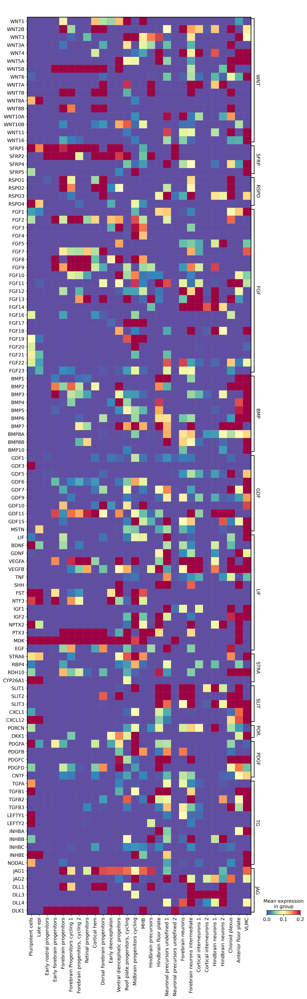

In [30]:
with plt.rc_context({"figure.figsize": [4, 4]}):
    sc.pl.matrixplot(adata_clusters_reordered, ligand_dict, groupby='cell_type',
                     cmap='Spectral_r', swap_axes=True,vmin = 0,vmax=0.2,dendrogram=False,save = 'ligands_matrixplot_rotated.svg')

In [31]:
small_ligand_dict = {
    'MHB': ['FGF8','FGF17'],
    'FP': ['BMP1','SHH',"SLIT1",'SLIT2','SLIT3','PDGFC'],
    'FB':['WNT5A','WNT7A','WNT7B','RSPO1','RSPO2','RSPO3']

}

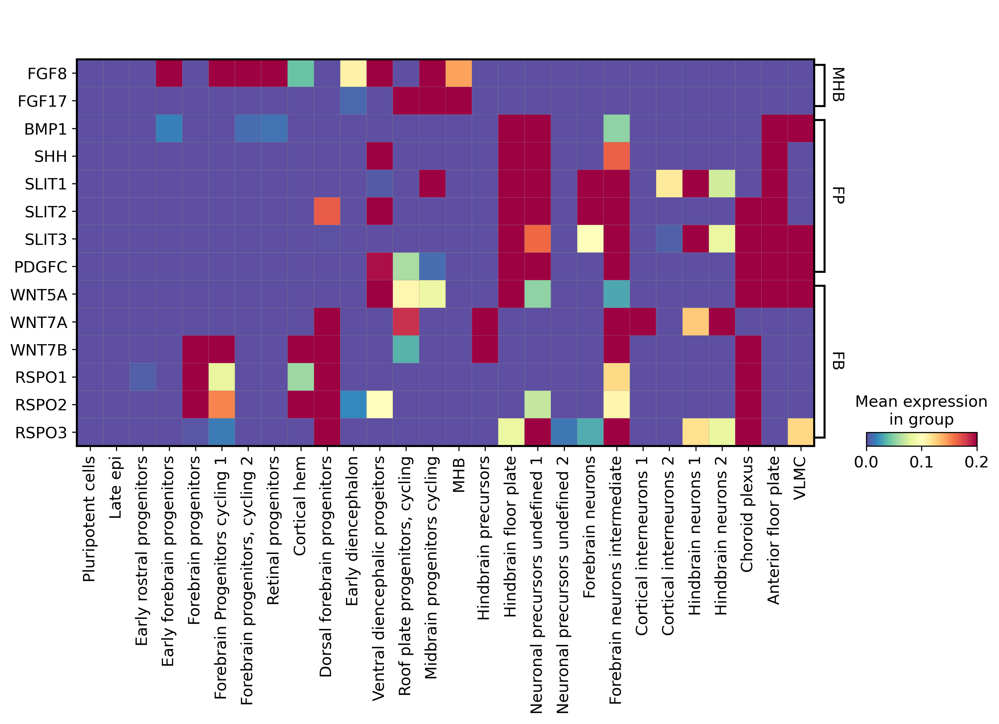

In [33]:
sc.pl.matrixplot(adata_clusters_reordered, small_ligand_dict, groupby='cell_type', cmap='Spectral_r', swap_axes=True,vmin = 0,vmax=0.2, dendrogram= False,
                 save = 'ligands_matrixplot_small.svg')

In [34]:
marker_genes ={'Pluripotent cells':['POU5F1','NANOG'],
                'MHB':['FGF17','PAX8','FZD10','GDF10'],
                'Early Diencephalon':['DLK1', 'VWF', 'FGF17' ],
                'Ventral diencephalic progenitors':['DLK1', 'GPC3', 'POU3F1','FZD5','NKX2-1','SHH','FGF8'],
                'Forebrain proenitors cycling':['TOP2A','PTTG1','CCNB1','DLX1','PAX6','SHH'],
                'Dorsal forebrain progenitors':['PAX6', 'EMX2',  'GPC3', 'WLS', 'BARHL1', 'FOXG1'],
                'Roof plate progenitors, cycling':['PAX7','GDF7'],
                'Hindbrain':['HOXA2','HOXB1', 'STMN2','DCX'],
                'Hindbrain precursors':['HOXA2','HOXB1', 'FGF17'],
                'Early rostral progenitors':['FGF8','FGFBP3','FOS','PAX8'],
                'Midbrain progenitors':['PTN', 'FOXA2', 'FGF8', 'GBX2', 'PAX5' ],
                'Late epi':['POU5F1','ZIC3','HESX1','SP5'],
                'Hindbrain Floor plate':['SHH', 'ARX', 'FOXA1'],
                'Forebrain progenitors cycling':['LHX2', 'FOXG1', 'RAX', 'SIX6'],
                'Cortical interneurons':['STMN2', 'DCX', 'DLX6', 'SST', 'VIP'],
                'Retinal progenitors':['DLK1', 'FOXG1', 'SIX3', 'SIX6', 'NR2E1'],
                'Cortical interneurons':['LHX1', 'GAD2', 'OTP', 'SIX3'],
                'Cortical hem':['GPC3', 'WLS', 'LHX5', 'PAX6', 'EMX2'],
                'Neuronal precursors,':['FOXP2','CUX1'],
                'Hindbrain neurons':['STMN2', 'DCX', 'NHLH1', 'ELAVL2', 'ASCL1', 'VSX1','VXN'],
                'Early forebrain progenitors':['RAX', 'FZD5', 'SIX3' ],
                'Neuronal precursors':['STMN2','ONECUT2'],
                'Forebrain neurons':['DCX','STMN2','ARX','SLC17A6'],
                'Forebrain neurons intermediate':['NHLH1','ASCL1','DLL3','WNT7A'],
                'Forebrain progenitors':['NKX2-1', 'FZD5', 'PAX6', 'WLS'],
                'Choroid plexus':['OTX2', 'GDF7', 'AQP1', 'TTR', 'CLIC6'],
                'Anterior floor plate':['SIX3', 'RAX', 'SHH', 'FOXA2'],
                'VLMC':['COL1A1', 'COL1A2']
}

#unique_genes = [
#    'POU5F1', 'NANOG','FOXG1',  'DLK1', 'VWF', 'GPC3', 'POU3F1', 
#    'FZD5', 'NKX2-1', 'SHH','RAX', 'SIX6', 'TOP2A', 'PTTG1', 'CCNB1', 'DLX1', 'PAX6', 'EMX2', 'FGF17', 'EN1', 'WNT1', 'FGF8','WLS', 
#    'PAX8', 'PTN', 'FOXA1','FOXA2', 'GBX2', 'PAX5', 'ZIC3', 'HESX1', 'SP5', 'ARX',  'LHX2', 
#    'DLX6', 'SST', 'VIP', 'SIX3', 'LHX1', 'GAD2', 'OTP', 'FOXP2', 'CUX1', 
#    'NHLH1', 'ELAVL2', 'ASCL1', 'VSX1', 'VXN', 'ONECUT2', 'SLC17A6', 'DLL3', 'WNT7A', 'COL1A1', 
#    'COL1A2', 'OTX2', 'AQP1', 'TTR', 'CLIC6'
#]


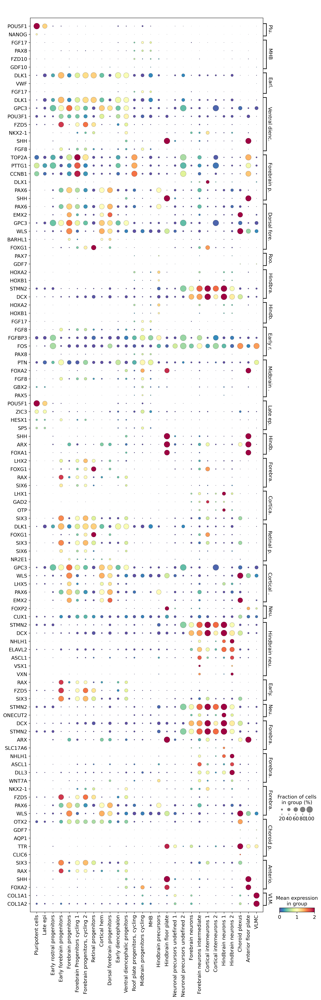

In [36]:
sc.pl.dotplot(adata_clusters_reordered, marker_genes, "cell_type", dendrogram=False, color_map = 'Spectral_r',swap_axes=True,vmin = 0,vmax = 2,save = 'interegrated_mistr_cluster_markers.svg')
#sc.pl.dotplot(adata, unique_genes, "cell_type", dendrogram=False, color_map = 'Spectral_r',swap_axes=True)

In [16]:
# List of genes to plot
genes = ['NANOG','POU5F1', 'HES1', 'SOX1', 'PAX6', 'STMN2', 'FGF17', 'FGF8', 'FOXG1', 'OTX2', 'LHX6','NKX2-1','FOXA2', 'HOXB1','SOX10','NANOG','HESX1','ZIC3','HES4','HES5','NKX6-2','IGFBP5','ASCL1','AQP1','ARX','LHX6','FOXG1','SST','PHOX2B','PAX3']

# Loop through each gene and generate UMAP plot
for gene in genes:
    with plt.rc_context({"figure.figsize": [10, 10]}):
        sc.pl.umap(adata, color=[gene], size=10, frameon=False, color_map='Spectral_r', vmin=0.0,
                   legend_fontsize=15, legend_loc='on data',show = False ,save=f'umap_atlas_{gene}.png')
